# Cell Tracking with MicroAtlas

This notebook visualizes the **MicroAtlas** cell tracking results on the **Fluo-N2DL-HeLa** dataset from the [**CTC (Cell Tracking Challenge)**](http://celltrackingchallenge.net/) benchmark.

We use Fluo-N2DL-HeLa as a representative example to demonstrate the tracking pipeline and evaluation metrics.

## Download Data

The **Fluo-N2DL-HeLa** dataset is part of the Cell Tracking Challenge and can be downloaded from the [CTC download page](http://celltrackingchallenge.net/participation/download/).

### Dataset structure

After downloading, place the dataset under `tracking/Fluo-N2DL-HeLa/` with the following structure:

```
tracking/Fluo-N2DL-HeLa/
├── 01/                  (sequence 01, 92 time frames)
│   ├── t000.tif
│   ├── t001.tif
│   └── ...
├── 01_GT/               (ground truth for sequence 01)
│   ├── SEG/             (manual segmentation masks)
│   │   ├── man_seg012.tif
│   │   └── ...
│   └── TRA/             (tracking ground truth)
│       ├── man_track.txt
│       ├── man_track000.tif
│       └── ...
├── 02/                  (sequence 02, 92 time frames)
│   ├── t000.tif
│   └── ...
└── 02_GT/               (ground truth for sequence 02)
    ├── SEG/
    └── TRA/
```

### Running the tracking pipeline

```bash
# Single sequence
python tracking/microatlas_tracking.py --input_dir tracking/Fluo-N2DL-HeLa/01

# Batch all datasets with MicroAtlas
python tracking/batch_tracking.py --models microatlas
```

## MicroAtlas Tracking Pipeline

The tracking pipeline (`tracking/microatlas_tracking.py`) consists of 4 steps:

1. **Frame segmentation** — MicroAtlas model segments each time point
2. **Cross-frame tracking** — IoU matching + Hungarian algorithm with division detection
3. **CTC submission** — Results saved in official format (SEG/ + TRA/)
4. **Evaluation** — Automated scoring via `py-ctcmetrics`

## Visualization: Fluo-N2DL-HeLa

### Sample Tracking Frame

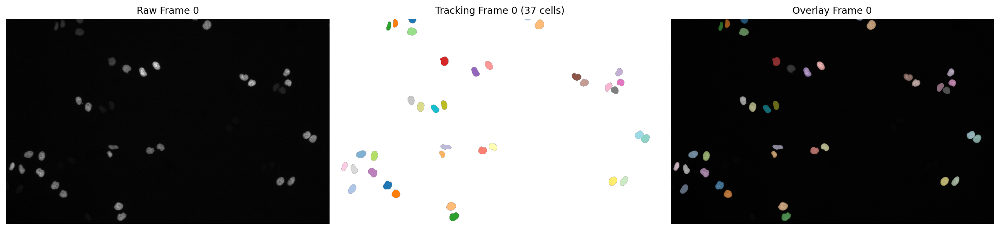

### Tracking Video

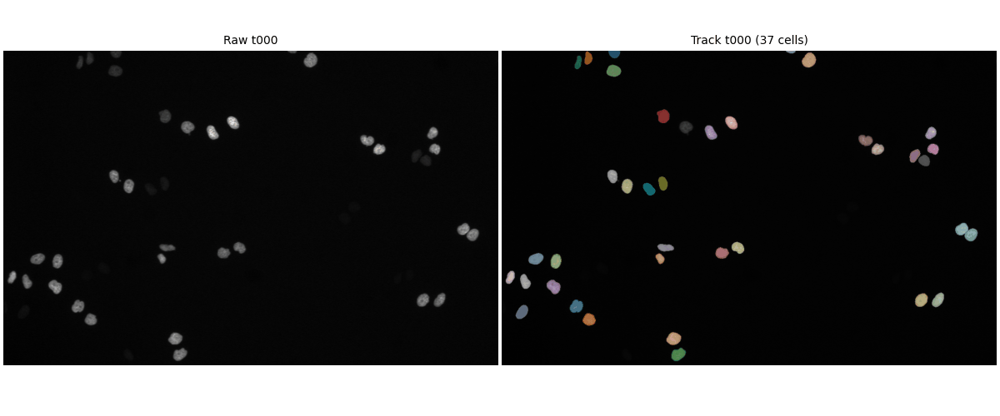

## Evaluation Metrics

Parsing `metrics.txt` from `py-ctcmetrics` for both sequences.

In [ ]:
import re
import pandas as pd
from pathlib import Path

NOTEBOOK_DIR = Path.cwd()
TRACKING_DIR = NOTEBOOK_DIR.parent.parent / "tracking"

def parse_metrics_txt(filepath):
    """Parse metrics.txt and return dict of metric -> value."""
    metrics = {}
    pattern = re.compile(r"^\s{2}(\w[\w()]+)\s*=\s*([\d\.\-]+)")
    with open(filepath, "r") as f:
        for line in f:
            m = pattern.match(line)
            if m:
                key = m.group(1)
                try:
                    metrics[key] = float(m.group(2))
                except ValueError:
                    metrics[key] = m.group(2)
    return metrics

metrics_all = {}
for seq in ["01", "02"]:
    metrics_path = TRACKING_DIR / "Fluo-N2DL-HeLa" / f"{seq}_microatlas_results" / "visualization_microatlas" / "metrics.txt"
    if metrics_path.exists():
        metrics_all[seq] = parse_metrics_txt(str(metrics_path))
        print(f"Seq {seq}: loaded {len(metrics_all[seq])} metrics")

### Core Tracking Metrics

In [ ]:
core_metrics = ["DET", "SEG", "TRA", "MOTA", "HOTA", "IDF1", "CHOTA"]

if metrics_all:
    rows = []
    for seq in sorted(metrics_all.keys()):
        row = {"Sequence": seq}
        for m in core_metrics:
            row[m] = metrics_all[seq].get(m, None)
        rows.append(row)

    df_core = pd.DataFrame(rows)
    styled = df_core.style.format(
        {m: "{:.4f}" for m in core_metrics}, na_rep="-"
    ).set_properties(**{'text-align': 'center'})

    print("Core CTC Tracking Metrics -- Fluo-N2DL-HeLa (MicroAtlas)")
    display(styled)

### AOGM Breakdown

| Metric | Description |
|---|---|
| AOGM_NS | Node splitting (false divisions) |
| AOGM_FN | False negative edges (missed divisions) |
| AOGM_FP | False positive edges (spurious links) |
| AOGM_ED | Edge deletion |
| AOGM_EA | Edge addition |
| AOGM_EC | Edge cost |

In [ ]:
aogm_metrics = ["AOGM", "AOGM_0", "AOGM_NS", "AOGM_FN", "AOGM_FP", "AOGM_ED", "AOGM_EA", "AOGM_EC"]

if metrics_all:
    rows = []
    for seq in sorted(metrics_all.keys()):
        row = {"Sequence": seq}
        for m in aogm_metrics:
            row[m] = metrics_all[seq].get(m, None)
        rows.append(row)

    df_aogm = pd.DataFrame(rows)
    styled = df_aogm.style.format(
        {m: "{:.0f}" for m in aogm_metrics}, na_rep="-"
    ).set_properties(**{'text-align': 'center'})

    print("AOGM Breakdown -- Fluo-N2DL-HeLa (MicroAtlas)")
    display(styled)

### Division Detection Metrics

In [ ]:
div_metrics = ["gt_divisions", "tp_div(0)", "fp_div(0)", "fn_div(0)", "BC(0)", "BC(1)", "BC(2)", "BC(3)"]

if metrics_all:
    rows = []
    for seq in sorted(metrics_all.keys()):
        row = {"Sequence": seq}
        for m in div_metrics:
            row[m] = metrics_all[seq].get(m, None)
        rows.append(row)

    df_div = pd.DataFrame(rows)
    int_cols = ["gt_divisions", "tp_div(0)", "fp_div(0)", "fn_div(0)"]
    fmt_dict = {m: "{:.0f}" for m in int_cols}
    fmt_dict.update({m: "{:.4f}" for m in ["BC(0)", "BC(1)", "BC(2)", "BC(3)"]})

    styled = df_div.style.format(fmt_dict, na_rep="-").set_properties(**{'text-align': 'center'})

    print("Division Detection Metrics -- Fluo-N2DL-HeLa (MicroAtlas)")
    display(styled)